In [ ]:
%%capture
import numpy as np
import pandas as pd
import argparse
import os
import matplotlib.pyplot as plt
%matplotlib inline
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import matplotlib.animation as animation
from IPython.display import HTML

In [ ]:
import random
manualSeed = 999
random.seed(manualSeed)
torch.manual_seed(manualSeed)
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

In [ ]:
dataroot = "data/celeba"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 5

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 2

In [ ]:
'''# Data loading cell
from google.colab import drive
drive.mount('/content/gdrive')'''

"# Data loading cell\nfrom google.colab import drive\ndrive.mount('/content/gdrive')"

In [ ]:
'''!pwd'''

'!pwd'

In [ ]:
#cd /content/gdrive/My Drive

In [ ]:
'''from zipfile import ZipFile
filename = 'Copy of img_align_celeba.zip'

with ZipFile(filename, 'r') as zip:
  zip.extractall()
  print('Done')

SyntaxError: EOF while scanning triple-quoted string literal (<ipython-input-7-253abfbdf293>, line 6)

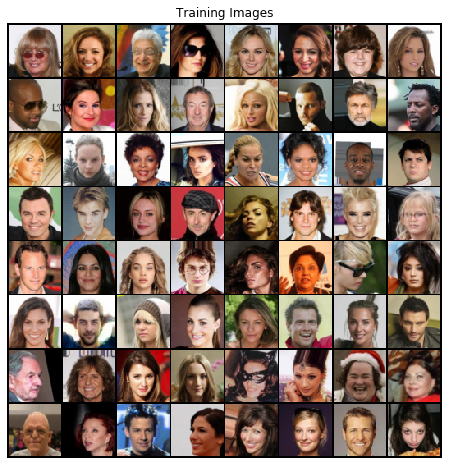

In [ ]:
# We can use an image folder dataset the way we have it setup.
# Create the dataset
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

# Actuation

In [ ]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [ ]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [ ]:
# Instantiating the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

DataParallel(
  (module): Generator(
    (main): Sequential(
      (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
      (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (8): ReLU(inplace=True)
      (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (11): ReLU(inplace=True)
      (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [ ]:
# Instantiate the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

DataParallel(
  (module): Discriminator(
    (main): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
      (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (4): LeakyReLU(negative_slope=0.2, inplace=True)
      (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (7): LeakyReLU(negative_slope=0.2, inplace=True)
      (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (10): LeakyReLU(negative_slope=0.2, inplace=True)
      (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    

In [ ]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [ ]:
# Training

print('Initializing...')

img_list = []
G_losses = []
D_losses = []
iters = 0

print("Beginning the Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ############################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Initializing...
Beginning the Training Loop...
[0/5][0/1583]	Loss_D: 1.6274	Loss_G: 4.0839	D(x): 0.4801	D(G(z)): 0.4740 / 0.0256
[0/5][50/1583]	Loss_D: 0.1007	Loss_G: 8.0077	D(x): 0.9537	D(G(z)): 0.0099 / 0.0009
[0/5][100/1583]	Loss_D: 0.4885	Loss_G: 5.9838	D(x): 0.8324	D(G(z)): 0.0633 / 0.0039
[0/5][150/1583]	Loss_D: 0.3768	Loss_G: 3.7575	D(x): 0.7970	D(G(z)): 0.0790 / 0.0339
[0/5][200/1583]	Loss_D: 1.7471	Loss_G: 7.6337	D(x): 0.3946	D(G(z)): 0.0008 / 0.0030
[0/5][250/1583]	Loss_D: 0.4689	Loss_G: 5.8471	D(x): 0.9113	D(G(z)): 0.2730 / 0.0053
[0/5][300/1583]	Loss_D: 0.6738	Loss_G: 7.3803	D(x): 0.8584	D(G(z)): 0.3526 / 0.0012
[0/5][350/1583]	Loss_D: 0.3401	Loss_G: 3.7408	D(x): 0.7960	D(G(z)): 0.0539 / 0.0368
[0/5][400/1583]	Loss_D: 0.5263	Loss_G: 4.7069	D(x): 0.8001	D(G(z)): 0.1442 / 0.0224
[0/5][450/1583]	Loss_D: 0.2472	Loss_G: 5.8364	D(x): 0.8883	D(G(z)): 0.0849 / 0.0064
[0/5][500/1583]	Loss_D: 0.4293	Loss_G: 4.4073	D(x): 0.7591	D(G(z)): 0.0445 / 0.0305
[0/5][550/1583]	Loss_D: 0.5756	L

RESULTS

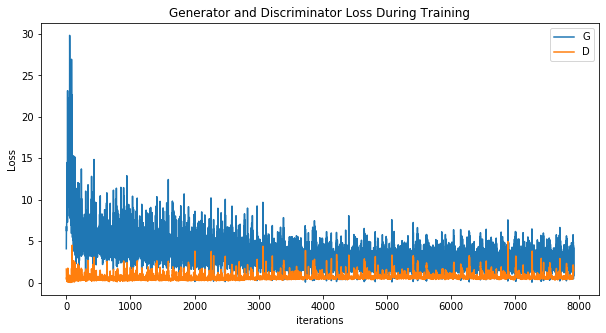

In [ ]:
# Plotting Loss vs training Iteration for both Generator and Discriminator
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

VISUALIZATION

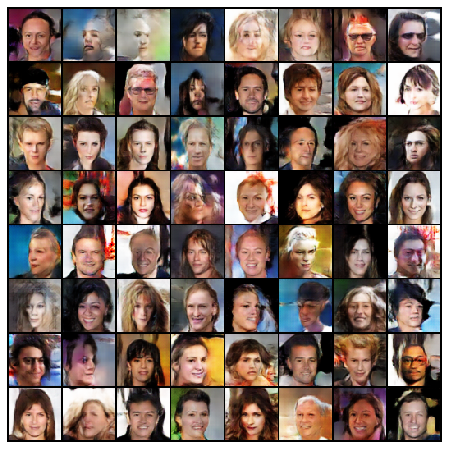

In [ ]:
# Visualization of G's progress
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

REAL vs FAKE

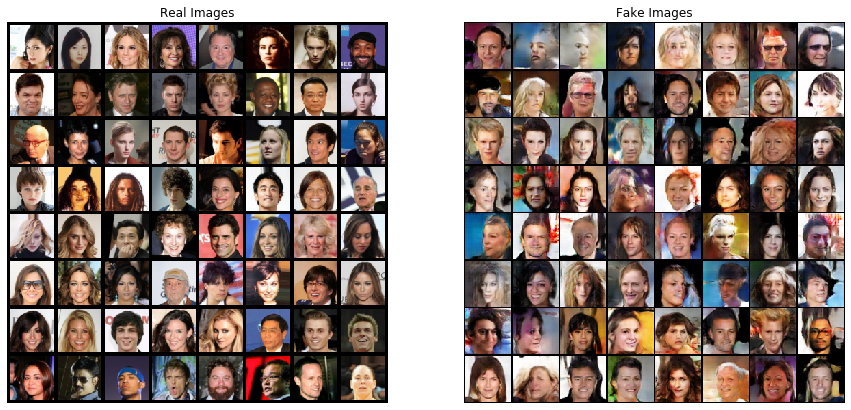

In [ ]:
# A batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plotting the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plotting the final fake images
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

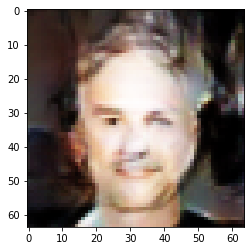

In [ ]:
z = torch.randn(1,100,1,1,device=device)
face = netG(z).detach().cpu()
Face = vutils.make_grid(face, padding=2, normalize=True)

plt.imshow(np.transpose(Face,(1,2,0)))

# Target Network

In [ ]:
'''#%%capture
#https://github.com/timesler/facenet-pytorch
!pip install facenet-pytorch
#!git clone https://github.com/timesler/facenet-pytorch.git facenet_pytorch
import facenet_pytorch
from facenet_pytorch import MTCNN, InceptionResnetV1
from PIL import Image'''

In [ ]:
"Run to see description of args"
#help(MTCNN)
#help(InceptionResnetV1)

In [ ]:
'''mtcnn = MTCNN(device='cuda:0')
resnet = InceptionResnetV1(pretrained='vggface2').eval()
img = Image.open('image_path') #Or convert tensor/np image to PIL Image
img_cropped = mtcnn(img)
resnet.classify = True
img_probs = resnet(img_cropped.unsqueeze(0))'''

In [ ]:
'''Face_recog = netD.Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
# to mean=0, stdev=0.2.
netD.apply(weights_init)'''

In [ ]:
class TargetNetwork(nn.Module):
  def __init__(self, ngpu=2, num_classes=20, nc=3, ndf=64):
    super(TargetNetwork, self).__init__()
    self.ngpu = ngpu
    self.num_classes = num_classes
    self.conv = nn.Sequential(
        # input is (nc) x 64 x 64
        nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
        nn.LeakyReLU(0.2, inplace=True),
        # state size. (ndf) x 32 x 32
        nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
        nn.BatchNorm2d(ndf * 2),
        nn.LeakyReLU(0.2, inplace=True),
        # state size. (ndf*2) x 16 x 16
        nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
        nn.BatchNorm2d(ndf * 4),
        nn.LeakyReLU(0.2, inplace=True),
        # state size. (ndf*4) x 8 x 8
        nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
        nn.BatchNorm2d(ndf * 8),
        nn.LeakyReLU(0.2, inplace=True),
        # state size. (ndf*8) x 4 x 4
    )

    self.classifier = nn.Sequential(
      nn.Linear(ndf*8*4*4,512),
      nn.ReLU(),
      nn.Linear(512,64),
      nn.ReLU(),
      nn.Linear(64,self.num_classes),
    )

  def forward(self, batch):
    batch_features = self.conv(batch)
    flatten = batch_features.view(batch_features.shape[0],-1)
    logits = self.classifier(flatten)
    return logits

In [ ]:
dataset = dset.ImageFolder(root="miniCelebA/train",
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
dataloader = DataLoader(dataset, batch_size = 64, num_workers=4)

In [ ]:
net = TargetNetwork().to(device)
optimizer = optim.Adam(net.parameters(), lr = 1e-4)
criterion = nn.CrossEntropyLoss()
epochs = 100
net.apply(weights_init)
# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    net = nn.DataParallel(net, list(range(ngpu)))

for epoch in range(epochs):
  print("starting epoch", epoch)
  for i, (image_batch, label_batch) in enumerate(dataloader):
    optimizer.zero_grad()
    batch_logits = net(image_batch)
    label_batch = label_batch.to(device)
    loss = criterion(batch_logits, label_batch)
    loss.backward()
    optimizer.step()

starting epoch 0
starting epoch 1
starting epoch 2
starting epoch 3
starting epoch 4
starting epoch 5
starting epoch 6
starting epoch 7
starting epoch 8
starting epoch 9
starting epoch 10
starting epoch 11
starting epoch 12
starting epoch 13
starting epoch 14
starting epoch 15
starting epoch 16
starting epoch 17
starting epoch 18
starting epoch 19
starting epoch 20
starting epoch 21
starting epoch 22
starting epoch 23
starting epoch 24
starting epoch 25
starting epoch 26
starting epoch 27
starting epoch 28
starting epoch 29
starting epoch 30
starting epoch 31
starting epoch 32
starting epoch 33
starting epoch 34
starting epoch 35
starting epoch 36
starting epoch 37
starting epoch 38
starting epoch 39
starting epoch 40
starting epoch 41
starting epoch 42
starting epoch 43
starting epoch 44
starting epoch 45
starting epoch 46
starting epoch 47
starting epoch 48
starting epoch 49
starting epoch 50
starting epoch 51
starting epoch 52
starting epoch 53
starting epoch 54
starting epoch 55
st

In [ ]:
#TESTING

'''target_identity = 14
label = np.zeros((64,20))
label[:,target_identity] = 1
target_label = torch.tensor(label, dtype=torch.float, device=device)
#target_label_batch = torch.full((64,), target_label, dtype=torch.float, device=device)


test_data = dset.ImageFolder(root="miniCelebA/test/18",
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))

loss = criterion(net(test_data),target_label).mean().item()
print(loss)'''

# Z optimiser

In [ ]:
# Optimization Loop

target_identity = 19
target_label = torch.full((64,), target_identity, dtype=torch.long, device=device)


#Optimal identity loss
lossID_min = 10000  #initializing to a high value

######################
#def target(candidate):
#    img = Image.open(candidate) #to PIL Image OR WHAT IDK
#    img_cropped = mtcnn(img)
#    resnet.classify = True
#    img_probs = resnet(img_cropped.unsqueeze(0))
#    return img_probs # WE CAN RETURN ONE OF THE PROBS CORRESPONDING TO THE IDENTITY
######################

for epoch in range(5):
    z = torch.randn(64, nz, 1, 1, device=device, requires_grad=True)
    optimizer_z = optim.SGD([z], lr=0.02, momentum=0.9)
    print('epoch number:',epoch)

    for iteration in range(1500):
        netG.zero_grad()
        netD.zero_grad()
        net.zero_grad()

        #Forward pass through Generator
        candidate = netG(z)

        #Passing through Discriminator
        outD = netD(candidate).view(-1)
        L_prior = -outD.mean()

        #Passing through the face recognition classifier
        L_id = criterion(net(candidate),target_label)      #CE loss here

        #Total Loss and Backprop
        loss = L_prior + 100*L_id

        loss.backward()

        #updating the z vector
        optimizer_z.step()

    lossID_mean = L_id.mean().item()

    if lossID_mean < lossID_min:
        z_opt = z
        lossID_min = lossID_mean

epoch number: 0
epoch number: 1
epoch number: 2
epoch number: 3
epoch number: 4


In [ ]:
print(L_prior)
print(L_id)
net(candidate)
target_label

tensor(-0.1088, device='cuda:0', grad_fn=<NegBackward>)
tensor(0.3982, device='cuda:0', grad_fn=<NllLossBackward>)


tensor([19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19,
        19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19,
        19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19,
        19, 19, 19, 19, 19, 19, 19, 19, 19, 19], device='cuda:0')

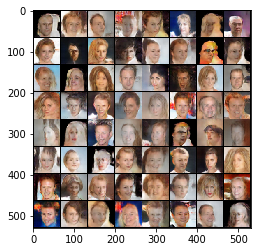

In [ ]:
result = netG(z_opt).detach().cpu()
result = result
Face = vutils.make_grid(result, padding=2, normalize=True)

plt.imshow(np.transpose(Face,(1,2,0)))

tensor(5.3901, device='cuda:0', grad_fn=<SelectBackward>)


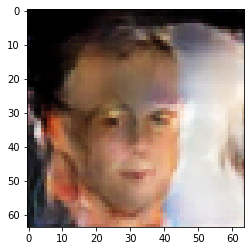

In [ ]:
temp_prob = 0
z_final = z_opt[0]
for z in z_opt:
    tt = torch.randn(1,100,1,1,device=device)
    tt[0] = z
    z = tt
    ls = net(netG(z))[0,target_identity]
    if ls > temp_prob:
        temp_prob = ls
        z_final = z
tt = torch.randn(1,100,1,1,device=device)
tt[0] = z_opt[0]
z_final = tt
face = netG(z_final).detach().cpu()
Face = vutils.make_grid(face, padding=2, normalize=True)
print(temp_prob)
plt.imshow(np.transpose(Face,(1,2,0)))

In [ ]:
ls.shape
ls

tensor(1.9521, device='cuda:0', grad_fn=<SelectBackward>)

In [ ]:
# Instantiate the Discriminator
temp_net = TargetNetwork().to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    temp_net = nn.DataParallel(temp_net, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
temp_net.apply(weights_init)

DataParallel(
  (module): TargetNetwork(
    (conv): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
      (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (4): LeakyReLU(negative_slope=0.2, inplace=True)
      (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (7): LeakyReLU(negative_slope=0.2, inplace=True)
      (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (10): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (classifier): Sequential(
      (0): Linear(in_features=8192, out_fe